In [1]:
import torch.nn as nn
import torch.functional as F
import torch
from torchvision import datasets, utils, transforms
import torch.optim as optim
from torchvision.utils import save_image, make_grid

import numpy as np
import matplotlib.pyplot as plt

In [2]:
torch.cuda.is_available()

True

In [3]:
epochs = 200
batch_size = 256
lr = 1e-04
device = torch.device('cuda' if torch.cuda.is_available else 'cpu')
latent_dim = 16
label = 7

In [4]:
##########################
# STEP 1: Define dataset #
##########################
transform = transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), transforms.ToTensor()])


def CIFAR10_subset(root, train, download, transform, target):
    CIFAR10 = datasets.CIFAR10(root=root, train=train, download=download, transform=transform)
    bool_targets = [idx==target for idx in CIFAR10.targets]
    index = [i for i, x in enumerate(bool_targets) if x]
    CIFAR10.data = [CIFAR10.data[idx] for idx in index]
    CIFAR10.targets = index
    return CIFAR10

trainset = CIFAR10_subset('./', True, True, transforms.Compose([transforms.RandomHorizontalFlip(p=0.5), transforms.ToTensor()]), 7)
train_loader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True, num_workers=2)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./cifar-10-python.tar.gz to ./


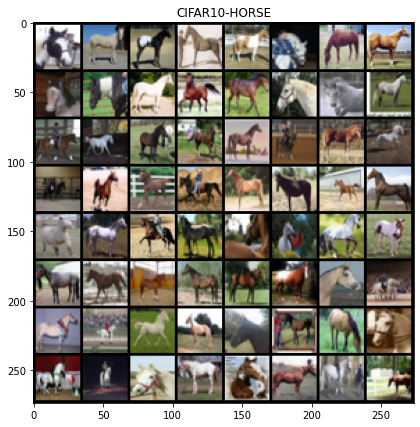

In [5]:
'''
Visualize CIFAR10-HORSE
'''

for image, _ in train_loader:
    plt.figure(figsize = (7,7))
    plt.title('CIFAR10-HORSE')
    plt.imshow(make_grid(image[:64], normalize=True).permute(1,2,0))
    break

In [6]:
####################################
# STEP 2: Define encoder & decoder #
####################################

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.conv = nn.Sequential(nn.Conv2d(3, 32, 3, stride=1, padding=1),
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(32, 64, 3, stride=2, padding=1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(64, 128, 3, stride=2, padding=1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(128, 256, 3, stride=2, padding=1),    
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU(),
                                  nn.Conv2d(256, 256, 3, stride=1, padding=1),    
                                  nn.BatchNorm2d(256),
                                  nn.LeakyReLU())
        self.fc = nn.Sequential(nn.Linear(256*4*4, 2*latent_dim),
                                nn.LeakyReLU())

                
    def forward(self,x):
        z = self.conv(x)
        z = z.view(z.shape[0], -1)
        z = self.fc(z)
        mu = z[:, :latent_dim]
        log_std = z[:, latent_dim:]
        return mu, log_std

class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.fc = nn.Sequential(nn.Linear(latent_dim, 4*4*128),                          
                                nn.LeakyReLU())
        self.conv = nn.Sequential(nn.ConvTranspose2d(128, 128, 4, stride=2, padding=1),
                                  nn.BatchNorm2d(128),
                                  nn.LeakyReLU(),
                                  nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),
                                  nn.BatchNorm2d(64),
                                  nn.LeakyReLU(),       
                                  nn.ConvTranspose2d(64, 32, 4, stride=2, padding=1), 
                                  nn.BatchNorm2d(32),
                                  nn.LeakyReLU(),       
                                  nn.Conv2d(32, 3, 3, padding=1))
                
    def forward(self, z):
        out = self.fc(z)
        out = out.view(out.shape[0], 128, 4, 4)
        out = self.conv(out)
        return out

In [7]:
##################################################
# STEP 3: Instantiate model & define other utils #
##################################################


# Instantiating Encoder and Decoder
Encoder = Encoder().to(device)
Decoder = Decoder().to(device)


# optimizer
optimizer = optim.Adam(list(Encoder.parameters()) + list(Decoder.parameters()), lr=lr, weight_decay=4e-03)


# log_p_theta_(z|x) (reconstruction loss)
def log_p(x_hat, x):
    mse = nn.MSELoss().to(device)
    return -mse(x_hat, x)

# reparametrization trick
def reparametrization_trick(mu, log_std):
    z = torch.randn_like(mu)*log_std.exp()+mu
    return z

def kl_div(mu, log_std):
    kl = -log_std - 0.5 + (torch.exp(2 * log_std) + mu ** 2) * 0.5
    kl = kl.sum(1).mean()
    return kl

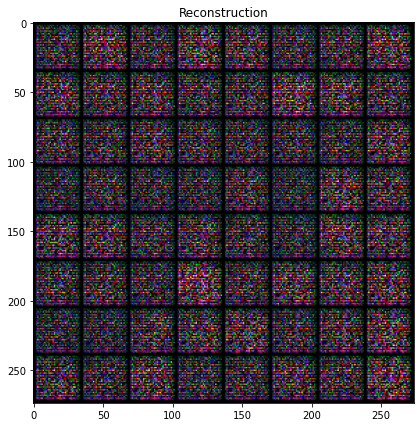

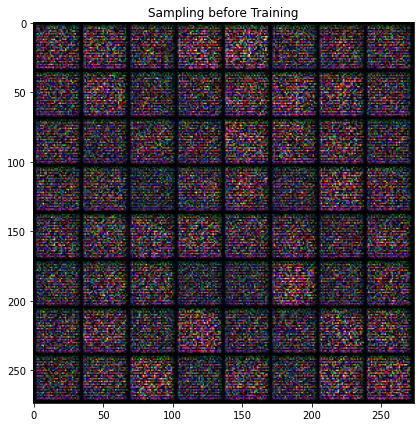

In [8]:
'''
Visualize reconstructed image & sampled image BEFORE TRAINING
'''

for i, data in enumerate(train_loader,1):   
    inputs, _ = data
    inputs = inputs.to(device)
    break
    
with torch.no_grad():
    mu, log_std = Encoder(inputs)
    x_hat = Decoder(mu)
    
    z = torch.randn_like(mu)
    samples = Decoder(z)
    save_image(x_hat[:64], "before_training_reconstruction.png")
    save_image(samples, "before_training_sample.png")
    
    plt.figure(figsize = (7,7))
    plt.title('Reconstruction')
    plt.imshow(make_grid(x_hat[:64].cpu()).permute(1,2,0))

    plt.figure(figsize = (7,7))
    plt.title('Sampling before Training')
    plt.imshow(make_grid(samples[:64].cpu()).permute(1,2,0))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


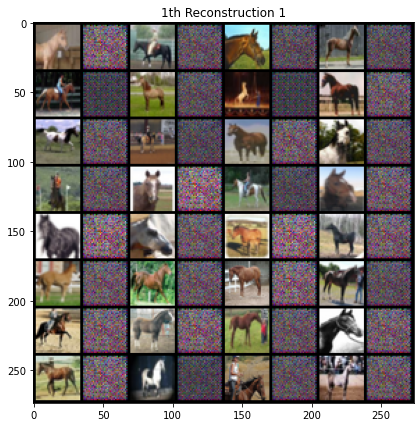

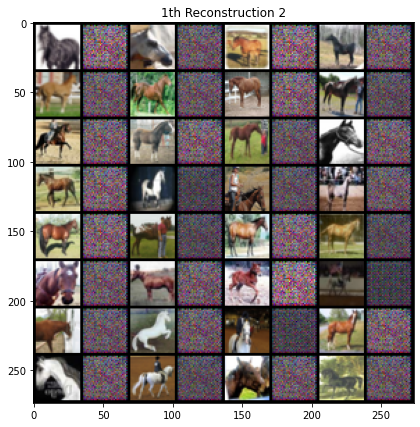

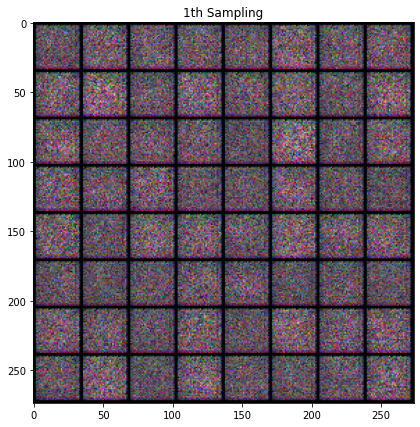

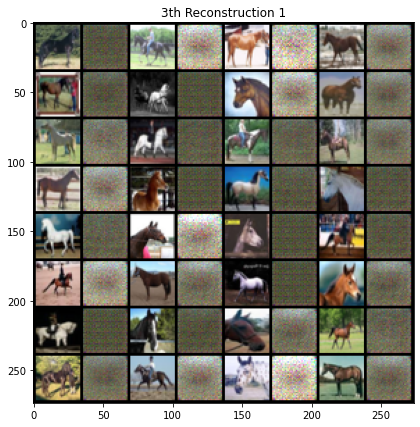

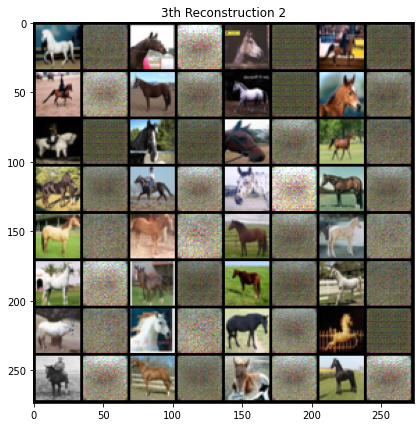

...

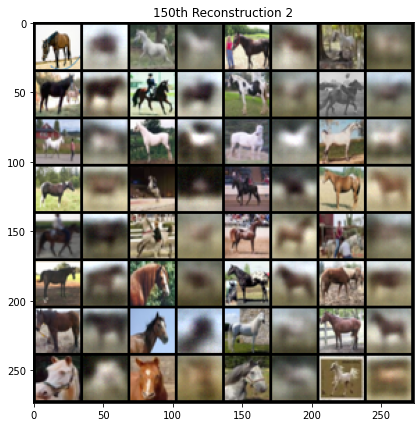

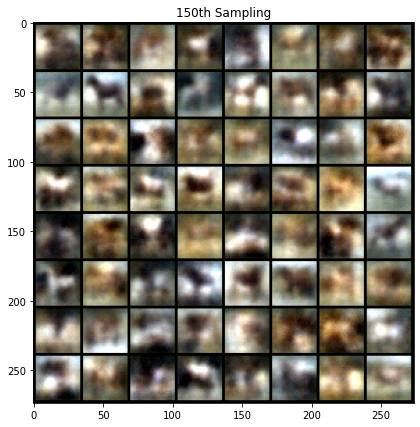

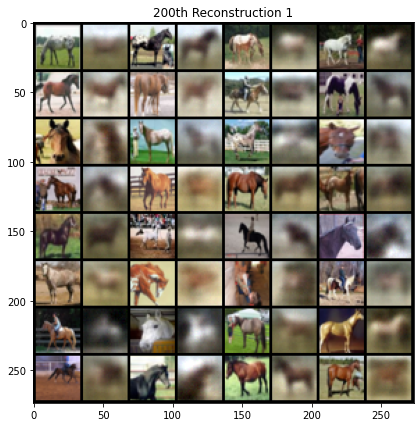

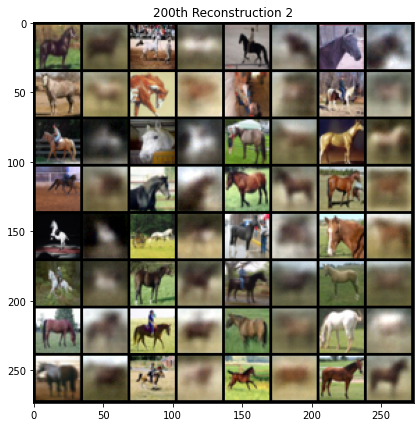

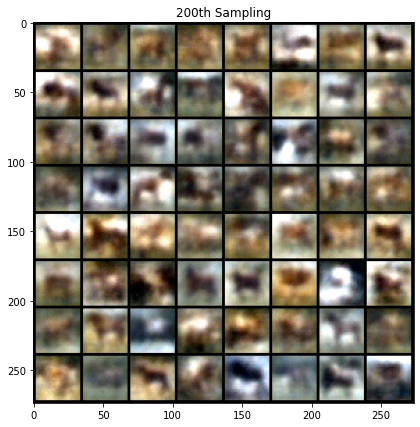

In [9]:
####################
# STEP 1: Training #
####################
for epoch_idx in range(1,epochs+1):
    for batch_idx, (img, _) in enumerate(train_loader):
        x = img.detach().to(device)
        mu, log_std = Encoder(x)
        z = reparametrization_trick(mu, log_std)
        x_hat = Decoder(z)

        x = x.view(x.shape[0], -1)
        x_hat = x_hat.view(x_hat.shape[0], -1)
        recon_loss = -log_p(x_hat, x)
        regularizer = kl_div(mu, log_std)

        loss = recon_loss*5000 + regularizer

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        print(f"[Epoch {epoch_idx:3d}] Processing batch #{batch_idx:3d} reconstruction loss: {recon_loss.item():.6f} regularization loss {regularizer.item():.6f} train_loss: {loss.item():.6f}", end='\r')

    if epoch_idx in [1,3,5,10,50,100,150,200]:
        for batch_idx, (img, _) in enumerate(train_loader):
            x = img.detach().to(device)
            mu, log_std = Encoder(x)
            x_hat = Decoder(mu)
            
            img_1 = torch.zeros(64, 3, 32, 32)
            img_2 = torch.zeros(64, 3, 32, 32)
            
            for i in range(0,32):
                img_1[2*i] = x[2*i]
                img_1[2*i+1] = x_hat[2*i]

                img_2[2*i] = x[32+2*i]
                img_2[2*i+1] = x_hat[32+2*i]
                
            save_image(img_1, '{}_th_recon_1.png'.format(epoch_idx))
            save_image(img_2, '{}_th_recon_2.png'.format(epoch_idx))

            z = torch.randn_like(mu)
            sample = Decoder(z)
            sample = sample.view(x.shape[0],3,32,32)
            save_image(sample[:64], '{}_th_sample.png'.format(epoch_idx))

            plt.figure(figsize = (7,7))
            plt.title('{}th Reconstruction 1'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(img_1.cpu(), min=0, max=1)).permute(1,2,0))

            plt.figure(figsize = (7,7))
            plt.title('{}th Reconstruction 2'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(img_2.cpu(), min=0, max=1)).permute(1,2,0))

            plt.figure(figsize = (7,7))
            plt.title('{}th Sampling'.format(epoch_idx))
            plt.imshow(make_grid(torch.clamp(sample[:64].cpu(), min=0, max=1)).permute(1,2,0))
            break